
<link rel="stylesheet" href="https://unpkg.com/thebe@latest/lib/index.css">
<script src="https://unpkg.com/thebe@latest/lib/index.js"></script>

<script type="text/javascript">
  document.addEventListener("DOMContentLoaded", function() {
    thebelab.bootstrap({
      requestKernel: true,
      binderOptions: {
        repo: "your-repo/your-project",
        ref: "main",
      },
      codeMirrorConfig: {
        theme: "abcdef",
      },
    });
  });
</script>


# **Data Readiness For AI Checklist - Part 5**

 * Creator(s) John Pill
 * Affiliation: UK Met Office
 * History: 1.0
 * Last update: 27 August 2024.


---

## **Tutorial Material**

* **Run this Jupyter notebook locally using Jupyter Lab**
* **Select 'Run All Cells' from the 'Run' menu to generate the checklist**.
* **Remember to save your notebook regularly as you work through it.**


## **Data section, optional**
Scripts for pulling the data into the notebook assuming

---

In [15]:
# Load the processed images from the Machine Learning Demo Project in this example project folder to a numpy array. 

from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".png") or filename.endswith(".jpg"):
            img_path = os.path.join(folder_path, filename)
            img = Image.open(img_path).convert("RGB")  
            img_array = np.array(img)
            images.append(img_array)
    return np.array(images)


processed_images_path = "../Machine_Learning_Demo_Project/GOES_images_processed"
image_array = load_images_from_folder(processed_images_path)
print(image_array.shape)

(432, 256, 256, 3)


## **Setup Notebook**

In [1]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import json
import sys
import os
sys.path.append(os.path.abspath('../../..')) # Add the parent directory to the system path
from utils import *

In [2]:
# Load checklist from JSON file:
checklist = load_checklist()

#### Reset stored answers to start again:

In [3]:
# Reset all checklist answers back to original blank answers for all sections.
# Any completed information will be lost. 

# To reset the stored answers uncomment and run these lines of code below. Re-comment the lines afterwards to avoid them running again. 
# reset_checklist()
# checklist = load_checklist()

# You can then re-run each section to reload it on the reset data. 

In [4]:

print("Dataset:", checklist["GeneralInformation"]["DatasetName"])
print("Dataset link:", checklist["GeneralInformation"]["DatasetLink"])
print("Assessor:", checklist["GeneralInformation"]["AssessorName"])
print("Assessor email:", checklist["GeneralInformation"]["AssessorEmailAddress"])

Dataset: Geostationary Operational Environmental Satellite (GOES)
Dataset link: https://www.noaasis.noaa.gov/GOES/goes_overview.html
Assessor: John Pill
Assessor email: john.pill@metoffice.gov.uk


---

## **5. Data Preparation**

### Null values

In [5]:

dataset_null_values = widgets.Combobox(
            value=checklist['DataPreparation']['NullValuesFilled'],
            options=['Yes', 'No', 'N/A'],
            description='5.1 Have null values/gaps been filled?',
            placeholder=placeholder,
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )

display(dataset_null_values)

Combobox(value='', description='5.1 Have null values/gaps been filled?', layout=Layout(width='900px'), options…

In [20]:
if np.any(np.isnan(image_array)):
    print("The images contain NaN values")
else:
    print("No Nan values found in the images")

black_pixels = np.all(image_array == 0, axis=-1)    # Create a mask for black pixels
white_pixels = np.all(image_array == 255, axis=-1)  # Create a mask for white pixels

if np.any(black_pixels):
    print("There are black pixels")

if np.any(white_pixels):
    print("There are white pixels")


No Nan values found in the images
There are black pixels
There are white pixels


> **Justification** <br>
> Reading the GOES documentation makes it clear it is highlighly likely that even the relativily small satallite image dataset we have here will have some missing values. <br>
> However as explained in the documentation these values will have been filled / imputted. For example checking for Nan values confirms this that the images hold no Nan values. <br>
> As an example we could look for specific fill values such as black (0,0,0) which is typically used to represent missing values in image datasets. 

### Outliers

In [6]:

dataset_outliers = widgets.Combobox(
            value=checklist['DataPreparation']['OutliersIdentified'],
            options=['Yes, tagged ', 'Yes, removed', 'No', 'N/A'],
            description='5.2 Have outliers been identified?',
            placeholder=placeholder,
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )

display(dataset_outliers)


Combobox(value='', description='5.2 Have outliers been identified?', layout=Layout(width='900px'), options=('Y…

> **Justification** <br>
> The dataset documentation has many references to outliers. For example values regularly recorded outside the sensor range. <br>
> "An outlier is an ABI fixed grid pixel in a specific band whose ABI L1b radiance value is outside of the product’s measurement range because some of its constituent detector samples have radiance values indicating over-saturation." <br>
> Below we have explored some techniques we could apply to check images for outllier values. 

In [24]:
# We could start by checking the minimum and maximum image RGB values. For images these should be 0-255.
# As our images are post-processed they should be within the range. 

print("Minimum image value", image_array.min())
print("Maximum image value", image_array.max())

Minimum image value 0
Maximum image value 255


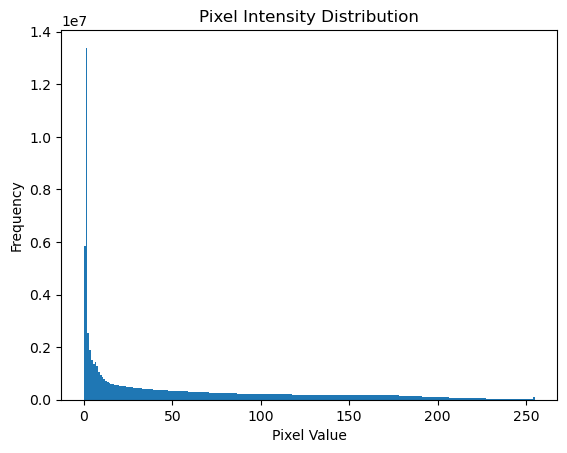

In [25]:
# We could also use a histogram to check for unusal spikes to suggest outlier values. 
# The significant amount of values at 0, could provide more evidence that solid black has been used to represent missing values. 
# This approach works for grayscale images (which we have here).

plt.hist(image_array.ravel(), bins=256, range=(0, 255))
plt.title("Pixel Intensity Distribution")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

In [31]:
# We could analyse the z-score for this problem, however as the bounds of the values are constrained by image values of 0-255 we are less likely to find a great deal of outliers with this method for this problem. 

from scipy.stats import zscore

# Calculate z-scores for pixel values (for grayscale)
z_scores = zscore(image_array.ravel())

# Define a threshold for outliers (e.g., |z| > 3)
threshold = 3
outliers = np.abs(z_scores) > threshold

# Count and display outliers
num_outliers = np.sum(outliers)
total_pixels = image_array.shape[0] * image_array.shape[1] * image_array.shape[2]
percentage = num_outliers / total_pixels * 100

print("Total number of pixels:", total_pixels)
print("Number of outliers based on z-score:", num_outliers)
print(f"Percentage of z-score with a z-score more than {threshold}: {round(percentage, 2)}%")

Total number of pixels: 28311552
Number of outliers based on z-score: 162858
Percentage of z-score with a z-score more than 3: 0.58%


In [37]:
%%time

# When working with images it can also be worth visualising them to check for anomalies. 
# Here is an approach to animate the images. 

from IPython.display import HTML
import matplotlib.animation as animation

num_images_to_animate = 100

def animate(image_array):
  fig, ax = plt.subplots()
  im = ax.imshow(image_array[0])
  plt.axis('off')

  def anim_(i):
    im.set_data(image_array[i])

  anim = animation.FuncAnimation(
      fig, anim_, interval=50, frames=image_array.shape[0], repeat_delay=1000)
  plt.close(fig)
  return anim

ani = animate(image_array[:num_images_to_animate])
HTML(ani.to_jshtml())

CPU times: user 5.31 s, sys: 33.5 ms, total: 5.35 s
Wall time: 5.71 s


### Gridded data


In [7]:

dataset_gridded = widgets.Combobox(
            value=checklist['DataPreparation']['Gridded'],
            options=['Regularly gridded in space', 'Constant time-frequency', 'Regularly gridded in space and constant time-frequency', 'Not gridded', 'N/A'],
            description='5.3 Is the data gridded (regularly sampled in time and space)?',
            placeholder=placeholder,
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )

dataset_gridded_transformed = widgets.Combobox(
            value=checklist['DataPreparation']['TransformedFromOriginal'],
            options=['Yes, from irregular sampling', 'Yes, from a different regular sampling', 'No, this is the original sampling', 'N/A'],
            description='If the data is gridded, was it transformed from a different original sampling?',            
            placeholder=placeholder,
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )


dataset_gridded_original_sample = widgets.Combobox(
            value=checklist['DataPreparation']['OriginalSamplingAvailable'],
            options=['Yes', 'No', 'Only by request', 'N/A'],
            description = 'If the data is resampled from the original sampling, is the data also available at the original sampling?',
            placeholder=placeholder,
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )

display(dataset_gridded, dataset_gridded_transformed, dataset_gridded_original_sample)

Combobox(value='', description='5.3 Is the data gridded (regularly sampled in time and space)?', layout=Layout…

Combobox(value='', description='If the data is gridded, was it transformed from a different original sampling?…

Combobox(value='', description='If the data is resampled from the original sampling, is the data also availabl…

> **Justification** <br>
> The example we have used in this assessment is not gridded, but a defined region.<br>
> However, many of the NOAA GOES produicts such as the Advanced Baseline Imager (ABI) are provided in regular grid formats.

### Targets / labels for supervised learning

In [8]:

dataset_targets_or_labels = widgets.Combobox(
            value=checklist['DataPreparation']['SupervisedLearningLabels'],
            options=['Yes', 'No', 'N/A'],
            description = '5.4 Are there associated targets or labels for supervised learning techniques?',
            placeholder='Click to select option - (Can this be used as a training dataset)?',
            layout=widgets.Layout(width=widget_width),
            style = description_style
            )

dataset_targets_or_labels_standards_label = widgets.Label(
    value = "If there are associated targets/labels, are community labeling standards implemented?"
)

dataset_targets_or_labels_standards = widgets.Text(
            value=checklist['DataPreparation']['SupervisedLearningLabelStandards'],
            placeholder = 'e.g., STAC label extension, ESA AIREO specification, etc.',
            layout = widgets.Layout(width=widget_width)
)

display(dataset_targets_or_labels, dataset_targets_or_labels_standards_label, dataset_targets_or_labels_standards)

Combobox(value='', description='5.4 Are there associated targets or labels for supervised learning techniques?…

Label(value='If there are associated targets/labels, are community labeling standards implemented?')

Text(value='', layout=Layout(width='900px'), placeholder='e.g., STAC label extension, ESA AIREO specification,…

In [9]:

# Save button
save_button = widgets.Button(description="Save Data Access Answers to json file",  button_style="primary",  layout=widgets.Layout(flex='1 1 auto', width='auto'))

def generate_updates_preparation():

    updates = {
        "DataPreparation": {
            "NullValuesFilled": dataset_null_values.value,
            "OutliersIdentified": dataset_outliers.value,
            "Gridded": dataset_gridded.value,
            "TransformedFromOriginal": dataset_gridded_transformed.value,
            "OriginalSamplingAvailable": dataset_gridded_original_sample.value, 
            "SupervisedLearningLabels" : dataset_targets_or_labels.value,
            "SupervisedLearningLabelStandards" : dataset_targets_or_labels_standards.value,
          
        }
    }
    return updates

save_button.on_click(lambda b: update_checklist(b, generate_updates_preparation()))

display(save_button)

Button(button_style='primary', description='Save Data Access Answers to json file', layout=Layout(flex='1 1 au…

## Finished

In [10]:

button_print_json = widgets.Button(description="Print json results",  button_style='info', layout=widgets.Layout(flex='1 1 auto', width='auto'))
output = widgets.Output()

display(button_print_json, output)

def print_json_info(b):
    """
    Loads a copy of the json file to checklist variable. 
    Then prints the json file contents to Jupyter notebook cell output.

    Arguments: b - represents the button calling the function. 
    """
    checklist = load_checklist()
    with output:
        clear_output()
        for key, value in checklist.items():
            print(f"{key}:")
            if isinstance(value, dict):
                for sub_key, sub_value in value.items():
                    print(f"  {sub_key}: {sub_value}")
            else:
                print(f"  {value}")

button_print_json.on_click(print_json_info)


Button(button_style='info', description='Print json results', layout=Layout(flex='1 1 auto', width='auto'), st…

Output()

---

## **Appendix** - Definition of terms used in the checklist.